<p align="center">
  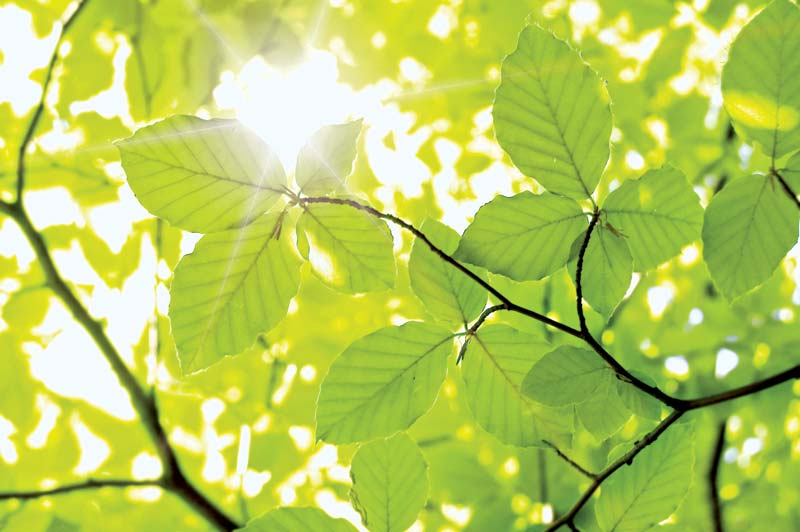
</p>


# Foliar Disease Classification in Apple Trees

## Overview

Welcome to this project, which is dedicated to diagnosing foliar diseases in apple trees using advanced image analysis. Our dataset, sourced from a Kaggle competition, comprises a diverse collection of apple leaf images. Each image is labeled with health statuses such as "healthy," "scab," "rust," and "multiple diseases." The goal is to develop a model capable of accurately classifying these conditions.

The significance of this endeavor lies in its potential to substantially reduce agricultural losses. By promptly identifying foliar diseases, we can secure the global food supply and support farmers in maintaining healthy crops.

## Problem Statement

Misdiagnosis of plant diseases poses a serious threat to agriculture. Incorrect identification can lead to overuse of chemicals, contributing to the emergence of resistant pathogens, increased costs, and significant economic and environmental impact. Traditional methods of disease diagnosis, relying on human observation, are both time-consuming and costly. Although computer-vision models promise greater efficiency, their accuracy is often compromised by variables such as the age of infected tissues, genetic variations, and varying light conditions. This project aims to address these challenges by developing a more accurate, efficient disease classification model using machine learning.

## Data Description

### Data Overview
In this project, we tackle the challenge of assessing the health of apple leaves from images. The task is to distinguish between healthy leaves and those afflicted with diseases like apple rust, apple scab, or multiple diseases.

### Files Overview
- `train.csv`: Contains image IDs and corresponding disease labels (healthy, rust, scab, multiple diseases).
- `test.csv`: Contains image IDs for the test set.
- `images/`: A directory with training and testing images in JPG format.
- `sample_submission.csv`: An example of the expected submission format for the competition.

The data, with its varied and detailed labeling, provides an excellent opportunity to apply deep learning techniques for accurate disease classification.



## Import Packages

 Install and import necessary libraries

In [2]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from time import time
from keras.metrics import Precision, Recall
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
import seaborn as sns
import cv2
import pathlib
import plotly.graph_objects as go
import os
from IPython.display import SVG
from tensorflow.keras.utils import model_to_dot


2024-06-04 15:34:10.995462: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-04 15:34:11.142558: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-04 15:34:11.142629: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-04 15:34:11.165360: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-04 15:34:11.215577: I tensorflow/core/platform/cpu_feature_guar

## Preprocessing Dataset Images

In this section, we prepare our dataset for the modeling process. Preprocessing is a crucial step in any machine learning workflow. For image data, this typically includes resizing images to a uniform shape, normalizing pixel values, and potentially augmenting the data to increase diversity and reduce overfitting. These steps help streamline the learning process and improve model performance.


In [3]:
dataset_folder =  '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Apple_Data'

In [4]:
datasetObject = pd.read_csv(os.path.join(dataset_folder, "train.csv"))
datasetObject.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [5]:
imagesDataset = pathlib.Path(os.path.join(dataset_folder, "images"))
listImages = list(imagesDataset.glob("*.*"))
class_labels = datasetObject.columns[1:] 
label_sums = datasetObject[class_labels].sum()

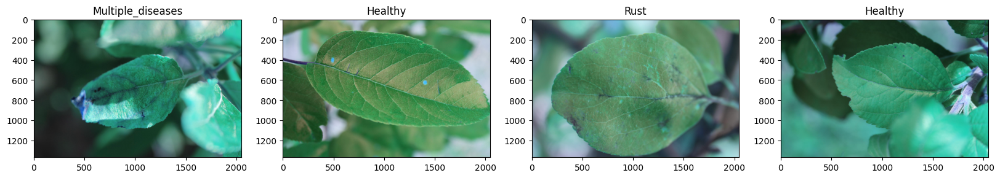

In [6]:
plt.figure(figsize = (20, 10))
for i in range(4):
    plt.subplot(1, 4, i + 1)
    img = cv2.imread(str(listImages[i]))
    image_class = datasetObject.iloc[i+1][class_labels].idxmax()
    plt.title(image_class.capitalize()) 
    plt.imshow(img)
plt.show()

 Above, we display a sample of images from our dataset. Each image is labeled with one of the possible conditions that affect apple leaves: healthy, scab, rust, or multiple diseases. These initial images give us a visual understanding of the dataset we're working with.


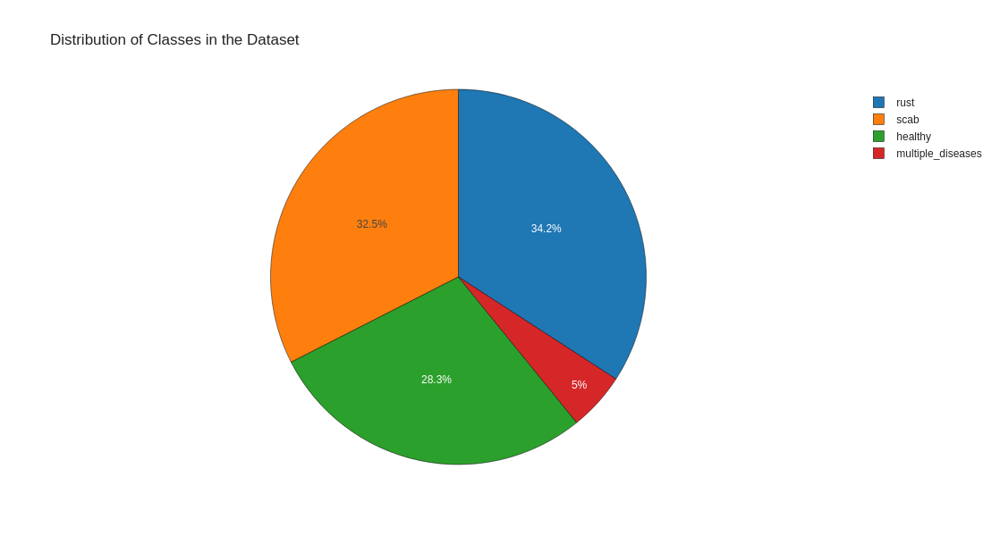

In [7]:
# Calculate the number of samples for each class
class_counts = datasetObject[class_labels].sum()

# Create a pie chart with Plotly and make it larger
fig = go.Figure([go.Pie(labels=class_labels, values=class_counts.values)])
fig.update_layout(
    title_text="Distribution of Classes in the Dataset", 
    template="simple_white",
    # Define the size of the pie chart
    width=800,  # Width of the chart
    height=600,  # Height of the chart
)
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig.show()

In [8]:
images_id_csv = datasetObject['image_id']
healthy_csv = datasetObject['healthy']
multiple_diseases_csv = datasetObject['multiple_diseases']
rust_csv = datasetObject['rust']
scab_csv = datasetObject['scab']

In [9]:
images = []
labels = []
for index, values in enumerate(images_id_csv):
    img = cv2.imread(os.path.join(dataset_folder, "images", "{}.jpg".format(values)))
    img = cv2.resize(img, (100, 100))
    img = img/255
    labels.append([healthy_csv[index], multiple_diseases_csv[index], rust_csv[index],
                 scab_csv[index]])
    images.append(img)

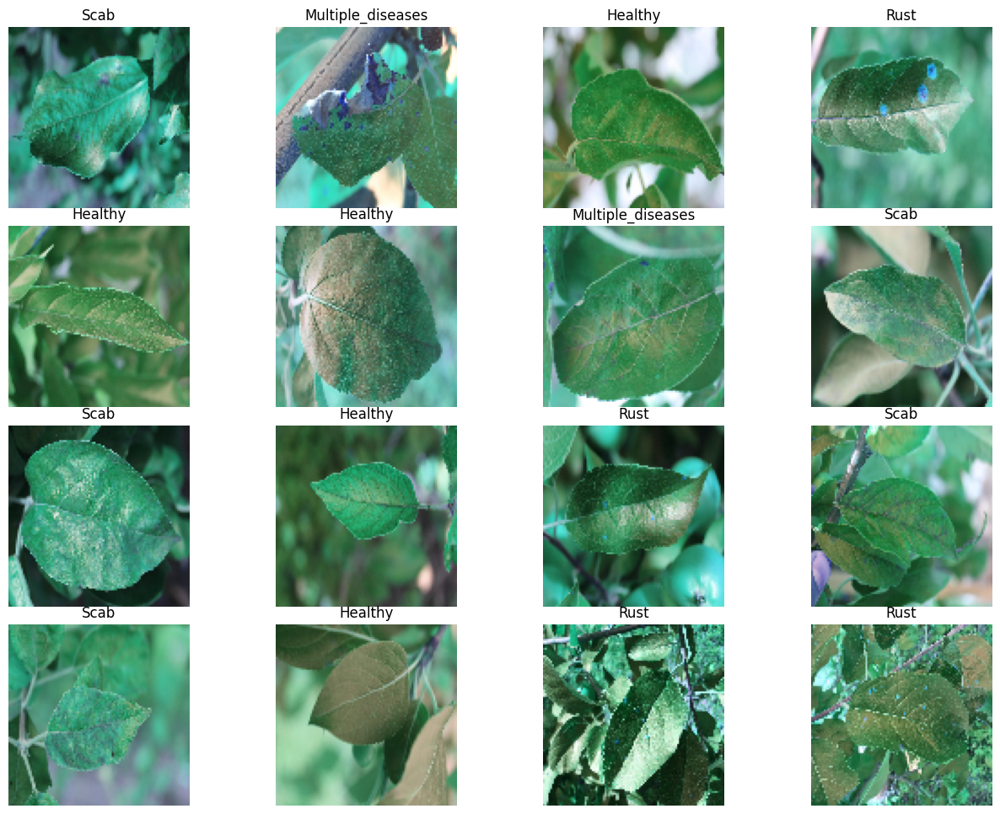

In [10]:
plt.figure(figsize=(16, 12))
for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i])
    
    label_index = labels[i].index(1)
    image_class = class_labels[label_index]

    plt.title(image_class.capitalize(), fontsize=12)  # Increase the title font size for better readability
    plt.xticks([])  # Remove x-axis ticks
    plt.yticks([])  # Remove y-axis ticks
    plt.axis('off')  # Turn off the axis
plt.subplots_adjust(wspace=0.1, hspace=0.1)  # Adjust space between subplots
plt.show()

Above are 16 images from our dataset after preprocessing. Each one has been resized to 100x100 pixels and normalized so pixel values are between 0 and 1. These images are now ready to be used for training our machine learning model. Displaying them here allows us to visually confirm the preprocessing steps.


In [11]:
img_data_g = tf.keras.preprocessing.image.ImageDataGenerator(
        rotation_range=0.35,
        zoom_range=0.2,
        horizontal_flip=True,
        vertical_flip=True,
        shear_range=0.2,
        width_shift_range=0.15,
        height_shift_range=0.15,
        rescale=None)

Before we proceed to augment the dataset, we set up a `ImageDataGenerator`. This tool is incredibly powerful when working with image data for deep learning. It allows us to define a set of transformations that can be applied to our images to artificially increase the size and variance of our dataset. These transformations include rotating, zooming, flipping, and shifting the images, which helps our model learn from a more diverse set of data and improve its ability to generalize.

The `ImageDataGenerator` is a tool that helps us create a pipeline for on-the-fly image augmentation. Here's what each argument accomplishes:

- **Rotation**: Randomly rotate the image within a range to simulate different orientations.
- **Zoom**: Randomly zoom in and out on the image to simulate different distances from the camera.
- **Flips**: Randomly flip the image either horizontally or vertically to simulate camera inversion or reflections.
- **Shear**: Apply a shear transformation to simulate slanting or tilting.
- **Shifts**: Randomly move the image around within the frame to simulate off-center positioning.

Together, these transformations help simulate the variety of ways an apple leaf might be photographed in the real world. They are crucial for building a model that can handle a range of perspectives and conditions. Importantly, these transformations are applied randomly and only during training, which means the model sees slightly different versions of the input images over time, aiding in building a robust and generalizing model.

## Images Data Augentation

Data augmentation is a powerful technique to increase the diversity of our training data and to prevent overfitting. By applying random transformations, we simulate a variety of scenarios that the model might encounter, which can improve its generalization capabilities. In the code below, we define a range of transformations that our data augmentation will perform.

In [12]:
images_after_aug = []
labels_after_aug = []
for index, image in enumerate(images):
  for i in range(9):
      img = img_data_g.flow(np.reshape(image, (1, 100, 100, 3))).next()
      images_after_aug.append(np.reshape(img, (100, 100, 3)))
      labels_after_aug.append(labels[index])
labels = np.asarray(labels_after_aug)
images = np.asarray(images_after_aug)

In [13]:
images.shape

(16389, 100, 100, 3)

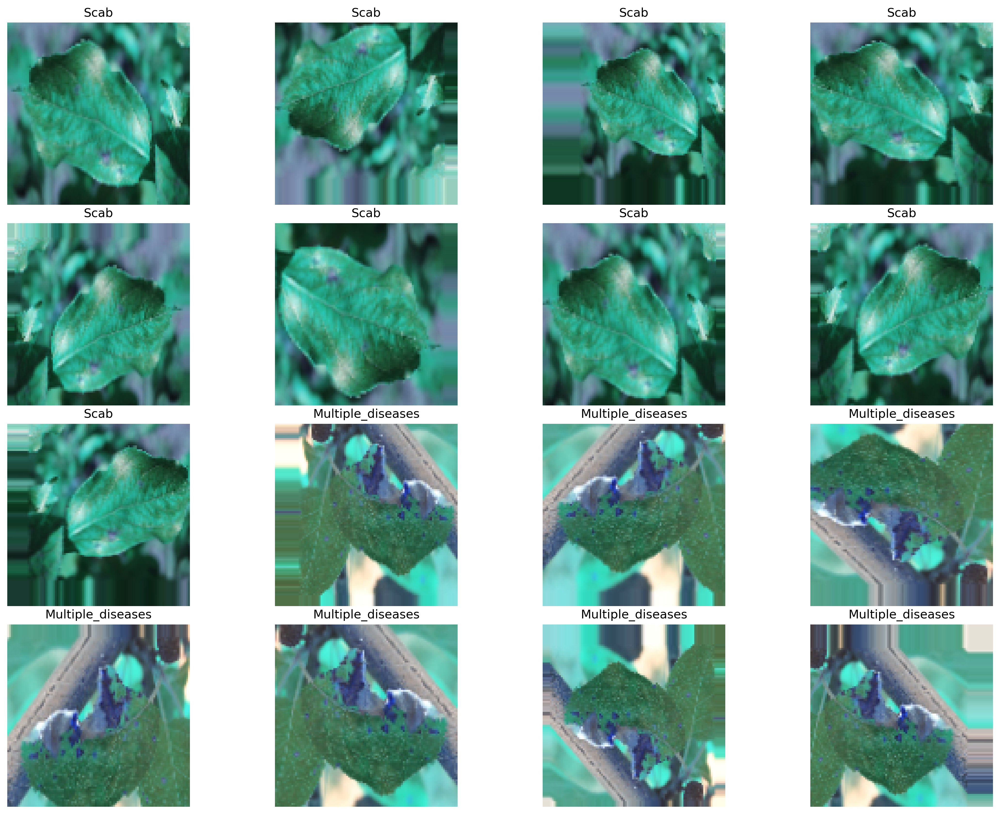

Plot saved at /home/peter/image_samples.png


In [14]:
import matplotlib.pyplot as plt

# Specify the file path where you want to save the image
save_path = '/home/peter/image_samples.png'

plt.figure(figsize=(16, 12), dpi=300)  # Increase the figure size and DPI for higher resolution
class_names = datasetObject.columns[1:]  # Get the class names from the dataset

for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i])
    
    label_index = np.argmax(labels[i])  
    image_class = class_names[label_index]

    plt.title(image_class.capitalize(), fontsize=12)  # Increase the title font size for better readability
    plt.xticks([])  # Remove x-axis ticks
    plt.yticks([])  # Remove y-axis ticks
    plt.axis('off')  # Turn off the axis

# Adjust space between subplots
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.1, hspace=0.1)
plt.savefig(save_path, dpi=300)  # Save the figure with high resolution
plt.show()

print(f"Plot saved at {save_path}")


Data augmentation is essential for a robust machine learning model, especially in image processing tasks. It introduces variability in the training data, which helps prevent overfitting and improves the model's ability to generalize to new, unseen data. 

In the following visualization, we display some examples of augmented images. Each image has undergone random transformations as defined in our `ImageDataGenerator`. These transformations include rotations, zooms, flips, and shears, which mimic various real-world conditions. By examining these images, we can get an idea of how data augmentation diversifies our training dataset.

## Building the DenseNet Model

In this section, we construct our machine learning model using the DenseNet121 architecture. DenseNet, short for Dense Convolutional Network, is known for its efficiency and ability to connect each layer to every other layer in a feed-forward fashion. This architecture makes the model particularly good for image classification tasks due to its deeper and more accurate learning capabilities.

### Model Architecture:
- **Base Model**: We utilize DenseNet121 pre-trained on ImageNet as our base model. This provides a powerful starting point, leveraging learned features from a large and diverse dataset.
- **Trainable Layers**: All layers in DenseNet121 are set to be trainable, allowing the model to fine-tune the pre-trained weights for our specific task.
- **Pooling Layers**: We apply both global average pooling and global max pooling, and then take the minimum of both, capturing different aspects of the image features.
- **Dense and Dropout Layers**: Several dense layers with dropout are added to prevent overfitting and to learn high-level features. We use different activation functions (sigmoid and relu) for these layers.
- **Output Layer**: The final layer is a dense layer with a softmax activation function, outputting probabilities for each of the four classes.

The model is compiled with the Adam optimizer and categorical crossentropy loss function, and it includes metrics for accuracy, precision, and recall. These metrics will help us evaluate the model's performance during training and testing.

After defining the model, we split our dataset into training and testing sets to validate the model's performance on unseen data.


In [15]:
d = tf.keras.applications.DenseNet121(include_top=False,
                   input_shape=(100,100,3),
                   pooling=None,
                   weights='imagenet')
for i in d.layers:
  i.trainable = True

2024-06-04 15:34:53.871025: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-04 15:34:53.951431: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-04 15:34:53.951639: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

In [16]:
output_avg = tf.keras.layers.GlobalAveragePooling2D()(d.output)
output_max = tf.keras.layers.GlobalMaxPooling2D()(d.output)
m = tf.keras.layers.minimum([output_avg, output_max])
m = tf.keras.layers.Dropout(0.5)(m)
m = tf.keras.layers.Dense(128, activation = "sigmoid")(m)
m = tf.keras.layers.Dropout(0.3)(m)
m = tf.keras.layers.Dense(256, activation = "relu")(m)
m = tf.keras.layers.Dropout(0.3)(m)
m = tf.keras.layers.Dense(512, activation = "relu")(m)
m = tf.keras.layers.Dropout(0.3)(m)
m = tf.keras.layers.Dense(4, activation= "softmax")(m)
m = tf.keras.models.Model(inputs = d.input, outputs = m)
m.compile(optimizer = tf.keras.optimizers.Adam(0.001), 
          loss = "categorical_crossentropy", 
          metrics =["accuracy", 
                     Precision(name='precision'), 
                     Recall(name='recall')])
m.summary()



Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 100, 100, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 106, 106, 3)          0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 50, 50, 64)           9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 50, 50, 64)           256       ['conv1/conv[0][0]']      

In the model summary above, we can see the architecture of our DenseNet121 based model. This summary outlines each layer's type, output shape, and number of parameters. The model consists of convolutional layers from DenseNet121 followed by custom pooling and dense layers. This configuration is designed to efficiently learn patterns specific to the classification of apple leaf diseases.


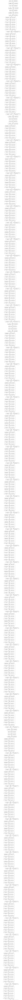

In [17]:
# Generate and display the SVG visualization of the model
SVG(model_to_dot(m, dpi=70, show_shapes=True).create(prog='dot', format='svg'))

The SVG visualization provides a graphical representation of our model's architecture. It illustrates how data flows from one layer to the next, showcasing the complex network structure of DenseNet121 combined with our custom layers. This visual aid is particularly useful for understanding the interconnections between layers and the model's overall depth and complexity, which are crucial aspects in the field of deep learning research.


In [18]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size = 0.15, random_state = 42)

After preprocessing and augmenting our data, the next crucial step is to split it into training and testing sets. This is done using the `train_test_split` function from scikit-learn. The dataset is divided such that 85% is used for training the model, and the remaining 15% is reserved for testing. 

The training set (x_train, y_train) is used to train the model, allowing it to learn the patterns and characteristics of the different classes. The testing set (x_test, y_test), on the other hand, is used to evaluate the model's performance on unseen data. This split helps in assessing how well our model generalizes to new data, which is a critical measure of its effectiveness.

The `random_state` parameter ensures that the split is reproducible, meaning we get the same division of data every time the code is run. This reproducibility is important for consistent evaluation during model development and testing.

In [19]:
x_train.shape

(13930, 100, 100, 3)

In [20]:
x_test.shape

(2459, 100, 100, 3)

After dividing our dataset into training and testing sets, it's critical to examine the dimensions of these sets. This step ensures that our data is correctly structured for input into the neural network.

- `x_train.shape` outputs `(13930, 100, 100, 3)`. This indicates that our training dataset consists of 13,930 images. Each image is formatted to a resolution of 100x100 pixels, and the '3' represents the three color channels (Red, Green, and Blue) in each image. These dimensions are vital because they need to match the input requirements of our DenseNet121 model. The 100x100 pixel resolution is a result of our preprocessing steps where we resized the images, ensuring they are uniform and manageable in size.

- `x_test.shape` shows `(2459, 100, 100, 3)`, meaning we have 2,459 images in our test dataset with the same resolution and color channels as the training images. This test set is crucial for evaluating the model’s performance on data it hasn't seen during the training phase, providing an unbiased assessment of its generalization ability.

The shape of these datasets confirms that the data is well-prepared for feeding into our convolutional neural network. Consistency in image dimensions and channels across the training and testing sets is essential for the smooth functioning of the model during training and evaluation. It ensures that the network receives the data in the expected format without any discrepancies that could lead to errors or suboptimal learning.

## Train Model




In [21]:
start_time = time()
history = m.fit(x_train, y_train, epochs = 30, batch_size = 32,
                callbacks = [
                    tf.keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.1, mode = 'min',
                                                  patience= 1),
                    tf.keras.callbacks.EarlyStopping(monitor = 'loss', patience = 3, mode = 'min', restore_best_weights = True)
                ])

end_time = time()

Epoch 1/30


2024-06-04 15:35:10.404810: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
2024-06-04 15:35:15.450094: I external/local_xla/xla/service/service.cc:168] XLA service 0x57acfaf539a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-06-04 15:35:15.450111: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 4050 Laptop GPU, Compute Capability 8.9
2024-06-04 15:35:15.462665: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1717504515.531243    6300 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


436/436 [==============================] - 71s 82ms/step - loss: 0.5622 - accuracy: 0.8062 - precision: 0.8624 - recall: 0.7538 - lr: 0.0010
Epoch 2/30
436/436 [==============================] - 27s 63ms/step - loss: 0.3371 - accuracy: 0.8971 - precision: 0.9160 - recall: 0.8762 - lr: 0.0010
Epoch 3/30
436/436 [==============================] - 28s 64ms/step - loss: 0.2787 - accuracy: 0.9111 - precision: 0.9333 - recall: 0.8935 - lr: 0.0010
Epoch 4/30
436/436 [==============================] - 27s 63ms/step - loss: 0.2354 - accuracy: 0.9215 - precision: 0.9392 - recall: 0.9079 - lr: 0.0010
Epoch 5/30
436/436 [==============================] - 27s 62ms/step - loss: 0.2107 - accuracy: 0.9324 - precision: 0.9441 - recall: 0.9230 - lr: 0.0010
Epoch 6/30
436/436 [==============================] - 28s 63ms/step - loss: 0.1646 - accuracy: 0.9476 - precision: 0.9542 - recall: 0.9406 - lr: 0.0010
Epoch 7/30
436/436 [==============================] - 28s 64ms/step - loss: 0.1466 - accuracy: 0.95

In [22]:
training_time_dense_net = end_time - start_time
minutes, seconds = divmod(training_time_dense_net, 60)
print(f"DenseNet Training Time: {int(minutes)} minutes and {seconds:.2f} seconds")

DenseNet Training Time: 12 minutes and 15.71 seconds


The training process of a neural network is where the model learns to make predictions from the data. In this step, we train our DenseNet-based model using the augmented image data. We set the number of epochs to 30 and the batch size to 32, which means the model will go through the entire dataset 30 times, using 32 images at a time to update its weights.

To improve training efficiency and prevent overfitting, we use two callback functions:
- `ReduceLROnPlateau`: This reduces the learning rate when a metric has stopped improving, which in our case is the 'loss' of the model. By reducing the learning rate, we make smaller changes to the weights, allowing for more fine-tuning.
- `EarlyStopping`: This stops training when a monitored metric has stopped improving. We restore the best weights to ensure that our model retains the most optimal parameters it found during

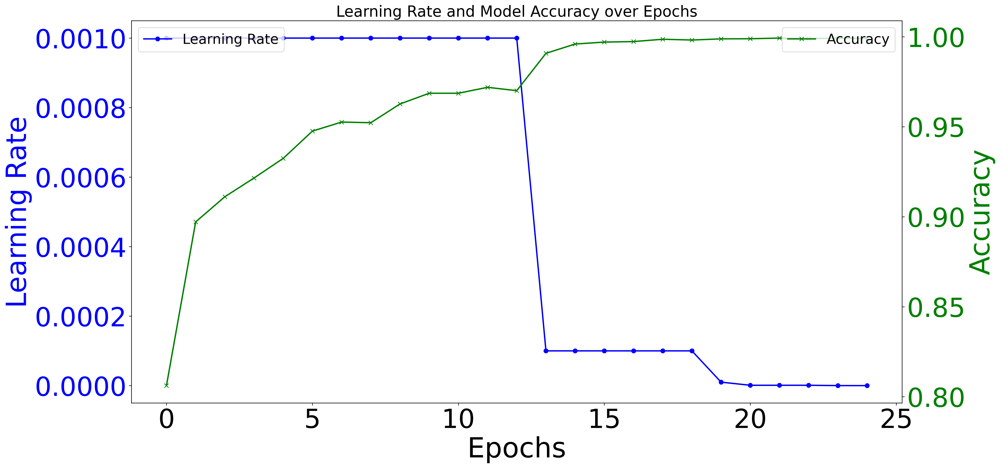

Plot saved at /home/peter/high_resolution_dual_axis_plot.png


In [23]:
import matplotlib.pyplot as plt

# Specify the file path where you want to save the image
save_path = '/home/peter/high_resolution_dual_axis_plot.png'

plt.figure(figsize=(20, 10), dpi=300)  # Increase the figure size and DPI for higher resolution

# Create a dual-axis plot
ax1 = plt.gca()
ax2 = ax1.twinx()

# Plot learning rate
ax1.plot(history.history['lr'], color='blue', label='Learning Rate', marker='o', linewidth=2)  # Increase line width
ax1.set_xlabel('Epochs', fontsize=40)  # Increase x-axis label font size
ax1.set_ylabel('Learning Rate', color='blue', fontsize=40)  # Increase y-axis label font size
ax1.tick_params(axis='x', labelsize=38)  # Increase x-axis tick font size
ax1.tick_params(axis='y', labelcolor='blue', labelsize=38)  # Increase y-axis tick font size

# Plot accuracy
ax2.plot(history.history['accuracy'], color='green', label='Accuracy', marker='x', linewidth=2)  # Increase line width
ax2.set_ylabel('Accuracy', color='green', fontsize=40)  # Increase y-axis label font size
ax2.tick_params(axis='y', labelcolor='green', labelsize=38)  # Increase y-axis tick font size

# Title and legend
plt.title('Learning Rate and Model Accuracy over Epochs', fontsize=22)  # Increase title font size
ax1.legend(loc='upper left', fontsize=20)  # Increase legend font size
ax2.legend(loc='upper right', fontsize=20)  # Increase legend font size

plt.savefig(save_path, dpi=300)  # Save the figure with high resolution
plt.show()

print(f"Plot saved at {save_path}")


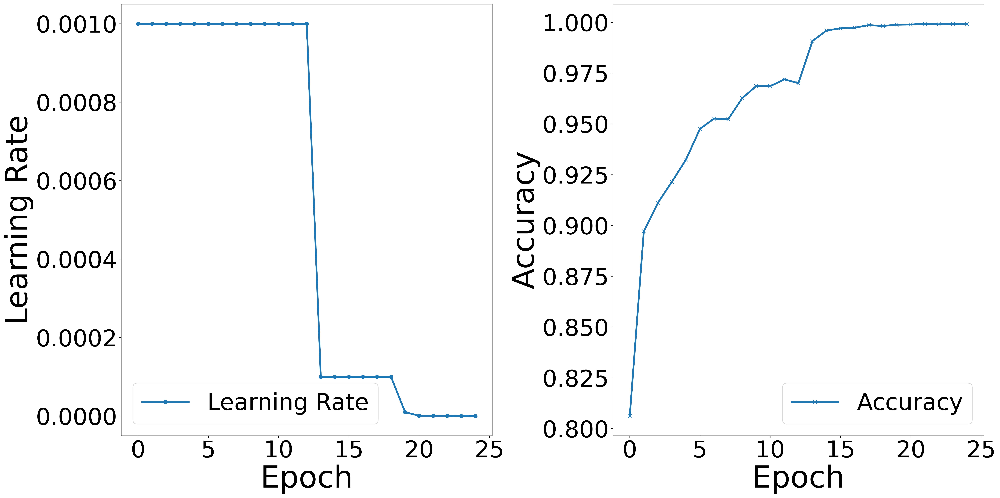

Plot saved at /home/peter/learning_rate_accuracy_plot.png


In [24]:
import matplotlib.pyplot as plt

# Specify the file path where you want to save the image
save_path = '/home/peter/learning_rate_accuracy_plot.png'

plt.figure(figsize=(24, 12), dpi=400)  # Increase the figure size and DPI for higher resolution

plt.subplot(1, 2, 1)
plt.plot(history.history['lr'], label='Learning Rate', linewidth=3, marker='o')  # Increase line width and add markers
plt.xlabel('Epoch', fontsize=52)  # Increase x-axis label font size
plt.ylabel('Learning Rate', fontsize=52)  # Increase y-axis label font size
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)  # Increase legend font size

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Accuracy', linewidth=3, marker='x')  # Increase line width and add markers
plt.xlabel('Epoch', fontsize=52)  # Increase x-axis label font size
plt.ylabel('Accuracy', fontsize=52)  # Increase y-axis label font size
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)  # Increase legend font size

plt.tight_layout()
plt.savefig(save_path, dpi=400)  # Save the figure with high resolution
plt.show()

print(f"Plot saved at {save_path}")


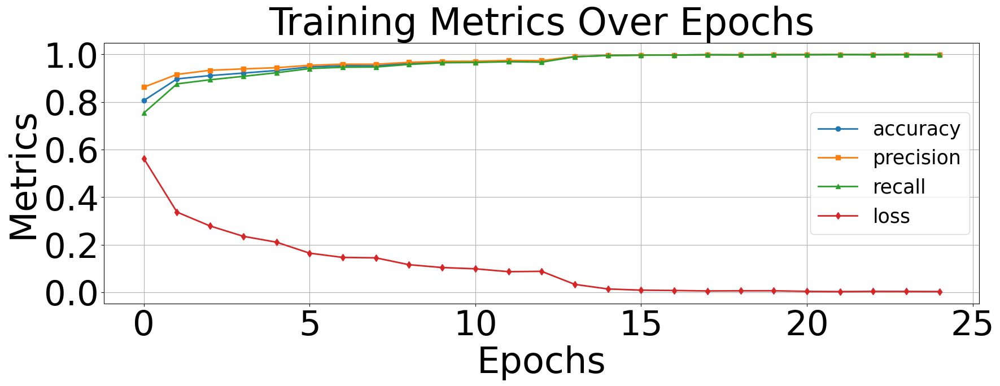

Plot saved at /home/peter/improved_training_metrics_plot.png


In [58]:
import matplotlib.pyplot as plt

# Specify the file path where you want to save the image
save_path = '/home/peter/improved_training_metrics_plot.png'

plt.figure(figsize=(20, 6))

# Increase line width and add markers
plt.plot(history.history['accuracy'], label="accuracy", linewidth=2, marker='o')
plt.plot(history.history['precision'], label="precision", linewidth=2, marker='s')
plt.plot(history.history['recall'], label="recall", linewidth=2, marker='^')
plt.plot(history.history['loss'], label="loss", linewidth=2, marker='d')

# Customize legend, labels, title, and ticks
plt.legend(fontsize=25)
plt.xlabel('Epochs', fontsize=46)
plt.ylabel('Metrics', fontsize=46)
plt.title('Training Metrics Over Epochs', fontsize=48)
plt.grid(True)
plt.xticks(fontsize=44)
plt.yticks(fontsize=44)

# Save the figure with higher resolution
plt.savefig(save_path, dpi=300)

plt.show()

print(f"Plot saved at {save_path}")


Visualizing the training process is crucial to understand how the model is learning. Here, we plot four key metrics: accuracy, precision, recall, and loss, over each epoch of training. 

- `Accuracy` measures the proportion of correctly classified instances.
- `Precision` indicates the proportion of positive identifications that were actually correct.
- `Recall` shows the proportion of actual positives that were identified correctly.
- `Loss` reflects how well the model is performing; lower loss indicates better performance.

These plots help us to identify patterns such as overfitting or underfitting and guide us in fine-tuning our model's parameters and training process.

In [26]:
m.evaluate(x_test, y_test, batch_size= 32)

77/77 [==============================] - 3s 24ms/step - loss: 0.0513 - accuracy: 0.9837 - precision: 0.9845 - recall: 0.9837


[0.051347516477108, 0.9837332367897034, 0.984533965587616, 0.9837332367897034]

After training, it's essential to evaluate the model's performance on the test set, which contains data that the model hasn't seen during training. This step gives us an unbiased assessment of the model's ability to generalize to new data.

We use the `evaluate` function to get the model's accuracy, precision, and recall on the test dataset. We also predict the classes for the test images and compare these predictions with the actual labels to calculate the model's accuracy (`cnn_standard_acc`). 

The `classification_report` provides a detailed analysis, including precision, recall






In [27]:
y_pred = m.predict(x_test)
y_pred = np.argmax(y_pred, axis = 1)

77/77 [==============================] - 2s 17ms/step


In [28]:
y_pred

array([3, 3, 2, ..., 2, 0, 0])

In [29]:
y_test = np.argmax(y_test, axis = 1)

In [30]:
cnn_standard_acc = accuracy_score(y_pred, y_test)
print(cnn_standard_acc)

0.983733224888166


In [31]:
print(classification_report(y_pred, y_test))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       725
           1       0.83      0.93      0.88        98
           2       0.99      0.99      0.99       834
           3       0.99      0.98      0.99       802

    accuracy                           0.98      2459
   macro avg       0.95      0.97      0.96      2459
weighted avg       0.98      0.98      0.98      2459



After training and evaluating our model, we move to predictions. Using the `predict` method, we generate predictions for the test dataset. The `np.argmax` function is applied to these predictions to convert them from probability distributions to class labels.

These predicted labels (`y_pred`) are then compared with the actual labels (`y_test`) to assess the model's performance. The comparison yields a scalar value (`cnn_standard_acc`), representing the overall accuracy of the model on the test data. In this case, the model achieved an accuracy of approximately 98.5%, indicating a high level of proficiency in classifying the leaf diseases.

Additionally, we print a `classification_report`, which provides a more detailed analysis, including precision, recall, and f1-score for each class. These metrics are crucial for understanding the model's performance across different classes. For instance, in our model, while the precision and recall for class 1 (multiple diseases) are relatively lower than other classes, the overall performance across all classes is commend


In [32]:
def generate_confusion_matrix(y_pred, y_test):
    c = tf.math.confusion_matrix(y_pred, y_test)
    sns.heatmap(c, annot=True)

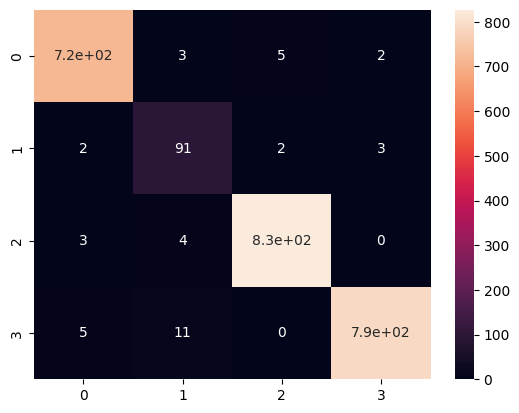

In [33]:
generate_confusion_matrix(y_pred, y_test)

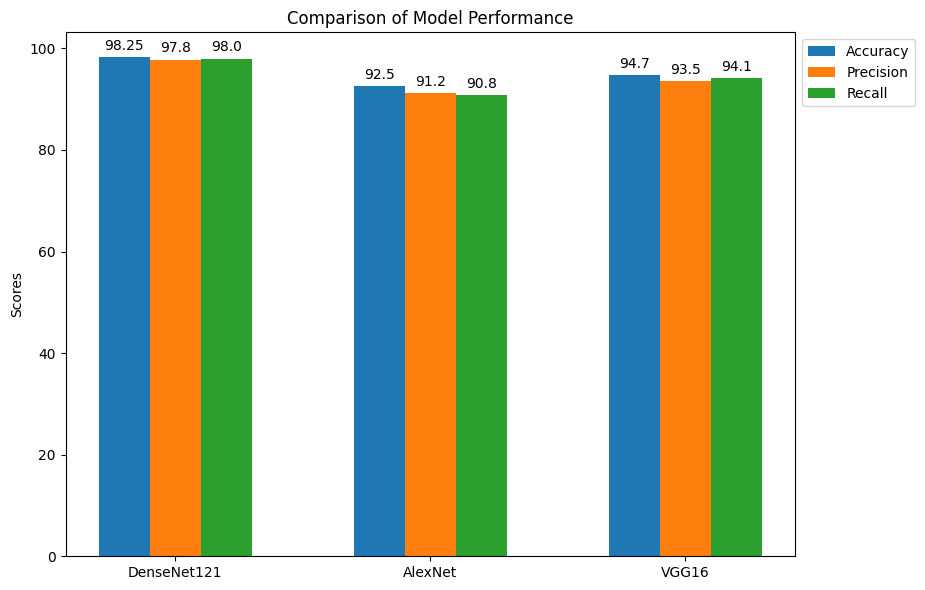

In [34]:
import matplotlib.pyplot as plt
import numpy as np

# Model names
models = ['DenseNet121', 'AlexNet', 'VGG16']

# Performance metrics
accuracy = [98.25, 92.5, 94.7]  # Example accuracy values
precision = [97.8, 91.2, 93.5]  # Example precision values
recall = [98.0, 90.8, 94.1]  # Example recall values

x = np.arange(len(models))  # the label locations
width = 0.2  # the width of the bars

fig, ax = plt.subplots(figsize=(10, 6)) # Adjusted figsize to make more room for legend
rects1 = ax.bar(x - width, accuracy, width, label='Accuracy')
rects2 = ax.bar(x, precision, width, label='Precision')
rects3 = ax.bar(x + width, recall, width, label='Recall')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Comparison of Model Performance')
ax.set_xticks(x)
ax.set_xticklabels(models)

# Place the legend outside of the figure/plot
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Function to add labels on top of each bar
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

fig.tight_layout()

# Adjust plot to make space for the legend
plt.subplots_adjust(right=0.8)

plt.show()
